In this post, I will analyze meteor landings throughout the world and take my first steps towards my goal of using astronomy and computer science to explore the mysteries of the universe! 

The data for this project comes from NASA's open data portal - [Nasa Meteorite Landings](https://data.nasa.gov/Space-Science/Meteorite-Landings/gh4g-9sfh). This is an amazing treasure trove of information for space buffs directly from NASA.

In order to map these sites of meteor landings in Python, I will use the [Folium](https://github.com/python-visualization/folium) module. Folium is a popular python library used to visualize geospatial data and create interactive maps.

First, lets load the Python modules that will be needed for this project. These include Pandas, Folium, Matplotlib, Math and Geopandas.

In [5]:
from folium.plugins import MarkerCluster
import pandas as pd
import folium
import matplotlib.pyplot as plt
import math
import geopandas

Download the Meteorite Landings csv file from this link ->  [Nasa Meteorite Landings](https://data.nasa.gov/Space-Science/Meteorite-Landings/gh4g-9sfh)

The next step is to read the csv file and see its structure. (Adjust the path name according to where you have downloaded the csv)

In [6]:
meteors_raw_data = pd.read_csv("./data/Meteorite_Landings.csv")
meteors_raw_data.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
0,Aachen,1,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,50.77500,6.08333,"(50.775, 6.08333)"
1,Aarhus,2,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,56.18333,10.23333,"(56.18333, 10.23333)"
2,Abee,6,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,54.21667,-113.00000,"(54.21667, -113.0)"
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,16.88333,-99.90000,"(16.88333, -99.9)"
4,Achiras,370,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,-33.16667,-64.95000,"(-33.16667, -64.95)"


This dataset contains the meteor name, mass, year and geographic coordinates.
Let's clean up the data and plot it on a map using their latitudes and longitudes.

The rows containg null or missing values for latitude and longitude are dropped and the result is plotted on a map.

As there are over 47,000 meteor landing points, plotting them together wil cause clutter on the map. So, I use a feature of Folium to cluster the points based on geography. 

Upon clicking the cluster, we can zoom in and view the meteor details individually!

In [7]:
meteors = meteors_raw_data.dropna(subset=["reclong", "reclat"]).drop_duplicates(subset=["reclong", "reclat"])
map = folium.Map(tiles='cartodbpositron', zoom_start=30)
marker_cluster = MarkerCluster().add_to(map)

for index, row in meteors.iterrows():
    name = row["name"]
    year = str(row["year"])
    latitude = row['reclat']
    longitude = row['reclong']

    popup_text = '<h3 style="color:green;">' + name + '</h3>'
    if year.lower() != "nan":
        popup_text = popup_text + year
    
    folium.Marker(location = [latitude, longitude], tooltip = popup_text).add_to(marker_cluster)
map

Now lets try to see the meteor count by country!

In [8]:
meteors_country = pd.read_csv("./data/Meteors_Landings_with_country_count.csv")
meteors_country.head()

,country,meteor_count,latitude,longitude
0,سلطنة عُمان Oman,3051,21.000029,57.003690
1,United States of America,1542,39.783730,-100.445882
2,Libya / ليبيا,1397,26.823447,18.123672
3,Australia,588,-24.776109,134.755000
4,الجزائر,579,28.000027,2.999983


Lets try to plot these country counts on a world map. The latitude and latitude for the countries were obtained by reverse geocoding. Reverse geocoding is the process of finding a place's name or a country's name given its latitude and longitude. For more information on this topic, look here : https://en.wikipedia.org/wiki/Reverse_geocoding

For this project, I used **GeoPy** which is an awesome and free Python client for geolocation services. (https://geopy.readthedocs.io/en/stable/)

(**NOTE** : You can also use **Google GeoCoding API** (https://developers.google.com/maps/documentation/geocoding/overview). But you will have to register with them for an API key and you will be subject to usage limits and possible charges)

In [9]:
min_meteor_count = meteors_country["meteor_count"].min()
 
max_meteor_count = meteors_country["meteor_count"].max()

meteors_country["meteor_count"].describe().to_frame()

,meteor_count
count,123.000000
mean,73.934959
std,336.031925
min,1.000000
25%,2.000000
50%,5.000000
75%,17.000000
max,3051.000000


Now lets plot a heatmap representing this data

In [10]:
from folium.plugins import HeatMap

meteor_heat_map = folium.Map(tiles='cartodbpositron', zoom_start=80)

location_data = meteors_country[['latitude', 'longitude']].values.tolist()

HeatMap(location_data).add_to(meteor_heat_map)
meteor_heat_map

Explore the heatmap to see the regions with most meteor falls!

From the heatmap, we can see that the densest cluster is around the Arabian peninsula, Nothern Africa and Eastern Europe.

Here's another static heatmap made using mpleaflet

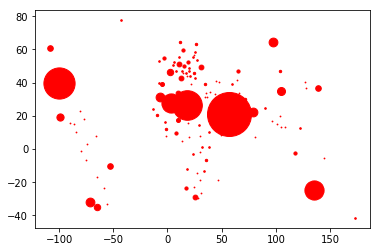

In [11]:
import matplotlib.pyplot as plt
import math

for index, row in meteors_country.iterrows():
    meteor_count = row["meteor_count"]
    latitude = row["latitude"]
    longitude = row["longitude"]
    ax = plt.plot(longitude,latitude,marker='o',color='Red',markersize=int(math.sqrt(meteor_count))*0.8)

In [12]:
import mplleaflet
# mplleaflet.show(fig=ax[0].figure)

# This opens the map as a HTML file in another tab
#See sample screenshot below

![A test image](./data/heat_map.jpg)